# 分析目的: 了解那些因素會影響汽車的價格

# 讀取Automobile資料、導入資料庫

https://www.kaggle.com/datasets/toramky/automobile-dataset


# 資料欄位說明

這份資料集包括以下欄位，依照三大類型實體（汽車特性規格、保險風險評級、正常化損失使用）進行分組：

## a) 汽車的各種特性規格 (Car Specifications)
- `make` (製造商)
- `fuel-type` (燃料類型)
- `aspiration` (進氣方式)
- `num-of-doors` (門數)
- `body-style` (車身風格)
- `drive-wheels` (驅動輪)
- `engine-location` (引擎位置)
- `wheel-base` (軸距)
- `length` (長度)
- `width` (寬度)
- `height` (高度)
- `curb-weight` (車身重量)
- `engine-type` (引擎類型)
- `num-of-cylinders` (汽缸數)
- `engine-size` (引擎大小)
- `fuel-system` (燃料系統)
- `bore` (缸徑)
- `stroke` (衝程)
- `compression-ratio` (壓縮比)
- `horsepower` (馬力)
- `peak-rpm` (最高轉速)
- `city-mpg` (市區油耗)
- `highway-mpg` (高速公路油耗)
- `price` (價格)
- 
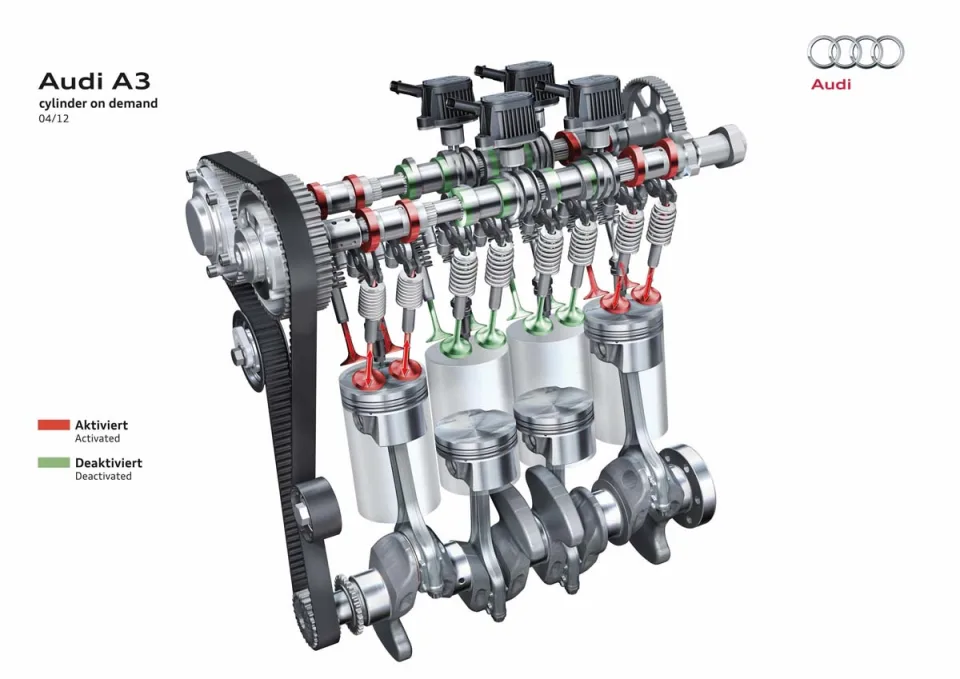
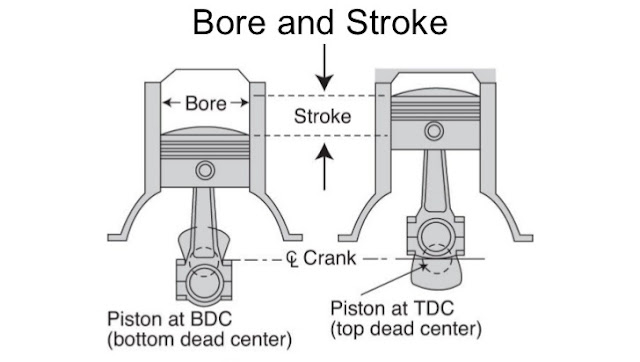


「缸徑×衝程」﹙Bore× Stroke﹚所得到的乘積，就是單缸的排氣量，再乘以汽缸數目，所得到的乘積，就是整具引擎的排氣量

## b) 其分配的保險風險評級 (Assigned Insurance Risk Rating)
- `symboling` (風險評等)
- A value of +3 indicates that the auto is risky, -3 that it is probably pretty safe

## c) 與其他車輛相比的正常化損失使用 (Normalized Losses Usage)
- `normalized-losses` (正常化損失)




*   將檔案以pandas讀取，並將不會使用的欄位刪除



In [100]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

df = pd.read_csv('../Automobile_data.csv')
df = df.drop(['normalized-losses'], axis=1)

# 設定圖表風格`
sns.set_theme(style='white')
df


,symboling,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,audi,gas,std,four,sedan,fwd,front,99.8,176.6,...,109,mpfi,3.19,3.4,10.0,102,5500,24,30,13950
4,2,audi,gas,std,four,sedan,4wd,front,99.4,176.6,...,136,mpfi,3.19,3.4,8.0,115,5500,18,22,17450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,...,145,idi,3.01,3.4,23.0,106,4800,26,27,22470


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   make               205 non-null    object 
 2   fuel-type          205 non-null    object 
 3   aspiration         205 non-null    object 
 4   num-of-doors       205 non-null    object 
 5   body-style         205 non-null    object 
 6   drive-wheels       205 non-null    object 
 7   engine-location    205 non-null    object 
 8   wheel-base         205 non-null    float64
 9   length             205 non-null    float64
 10  width              205 non-null    float64
 11  height             205 non-null    float64
 12  curb-weight        205 non-null    int64  
 13  engine-type        205 non-null    object 
 14  num-of-cylinders   205 non-null    object 
 15  engine-size        205 non-null    int64  
 16  fuel-system        205 non

# 統計資料集中各品牌的資料占比

# 汽車品牌按國家分組

| 日本            | 德國           | 法國      | 瑞典              | 美國                     | 英國      | 意大利       |
|----------------|---------------|----------|------------------|-------------------------|----------|-------------|
| Toyota         | Volkswagen    | Peugeot  | Volvo            | Dodge                   | Jaguar   | Alfa Romeo  |
| Nissan         | Mercedes-Benz | Renault  | Saab (已停產)    | Plymouth (已停產)       |          |             |
| Mazda          | BMW           |          |                  | Chevrolet               |          |             |
| Mitsubishi     | Audi          |          |                  | Mercury (已停產)        |          |             |
| Honda          | Porsche       |          |                  |                         |          |             |
| Subaru         |               |          |                  |                         |          |             |
| Isuzu          |               |          |                  |                         |          |             |



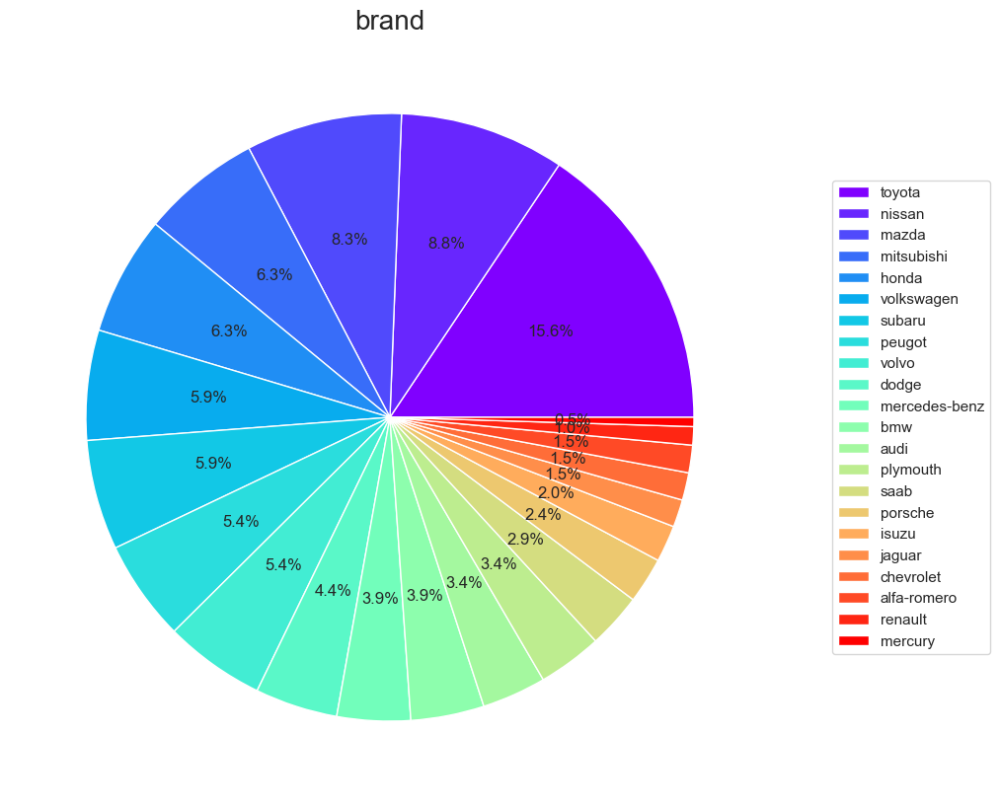

In [102]:
# 利用累加來統計不同品牌的資料量
data=df['make'].value_counts()

# 使用matplotlib來繪製不同品牌的占比
plt.figure(figsize=(10, 10))
plt.pie(data, autopct='%1.1f%%', startangle=0, colors=plt.cm.rainbow(np.linspace(0, 1, len(data))), pctdistance=0.6)
plt.title('brand', fontsize=20)
plt.legend(labels=data.index, loc='center right', bbox_to_anchor=(1.3, 0.5))





# 不同車子品牌的價格分佈圖 (以Box-Plot呈現)



In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   make               205 non-null    object 
 2   fuel-type          205 non-null    object 
 3   aspiration         205 non-null    object 
 4   num-of-doors       205 non-null    object 
 5   body-style         205 non-null    object 
 6   drive-wheels       205 non-null    object 
 7   engine-location    205 non-null    object 
 8   wheel-base         205 non-null    float64
 9   length             205 non-null    float64
 10  width              205 non-null    float64
 11  height             205 non-null    float64
 12  curb-weight        205 non-null    int64  
 13  engine-type        205 non-null    object 
 14  num-of-cylinders   205 non-null    object 
 15  engine-size        205 non-null    int64  
 16  fuel-system        205 non

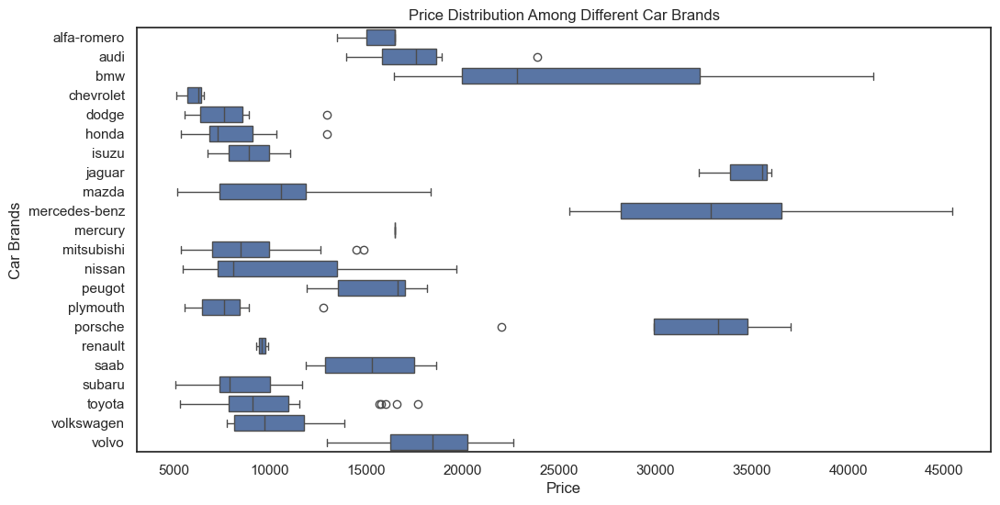

In [104]:
# 利用matplotlib來繪製box-plot已呈現不同車子品牌及價格關係
plt.figure(figsize=(12, 6))

# 將'price'欄位轉換為數字型態，並且忽視無效或缺失的值
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# 以box-plot呈現不同品牌的價格分布圖
sns.boxplot(x='price', y='make', data=df)
# sns.catplot(data=df, x='price', y='make', kind="box")

plt.title('Price Distribution Among Different Car Brands')
plt.xlabel('Price')
plt.ylabel('Car Brands')
plt.show()

## 確認其他汽車欄位對應價格的影響關係 (以 corr heat map 呈現)

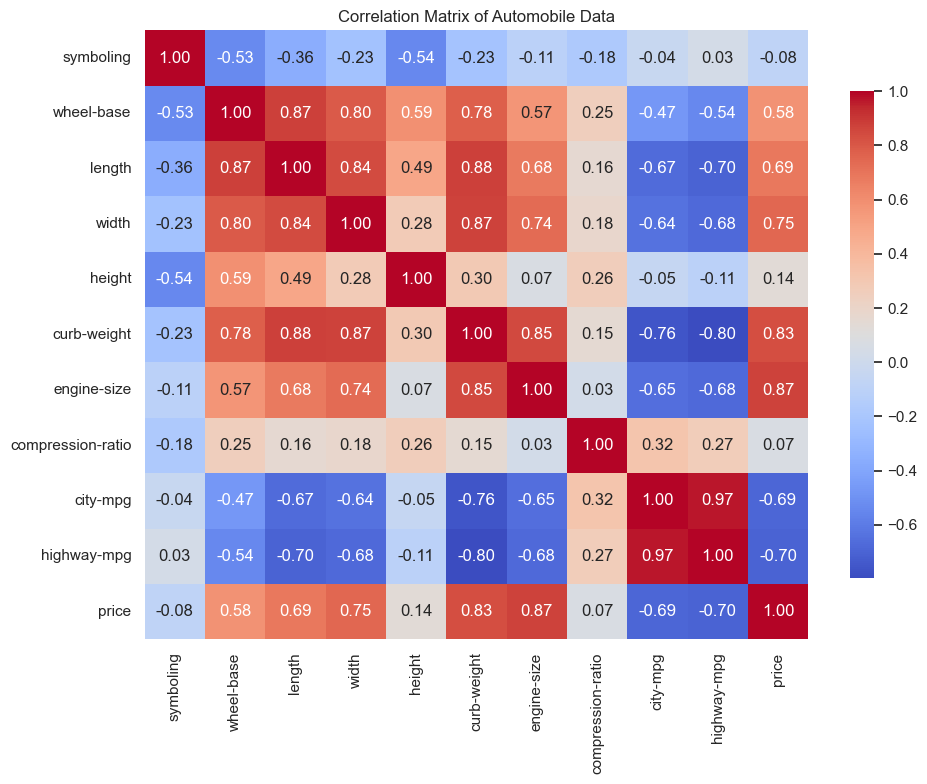

In [105]:
numeric_columns = df.select_dtypes(include=[np.number]).columns; numeric_columns

# Keep only numeric columns for correlation matrix
df_numeric = df[numeric_columns]

# Calculate correlation matrix
corr_matrix = df_numeric.corr()

# Setting up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'shrink': .8})

# Add title and possibly adjust layout
plt.title('Correlation Matrix of Automobile Data')
plt.tight_layout()

# Show the plot
plt.show()

# 散佈圖

*   **車子價格與引擎尺寸**
*   **車子價格與馬力**
*   **車子價格與城市油耗量**
*   **車子價格與高速公路油耗量的關係**





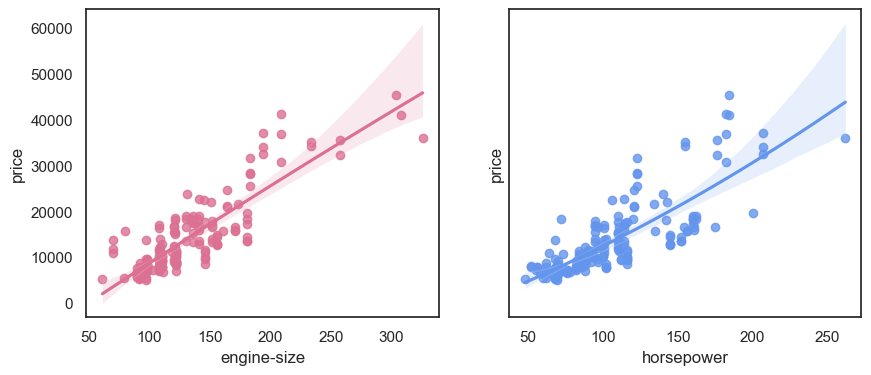

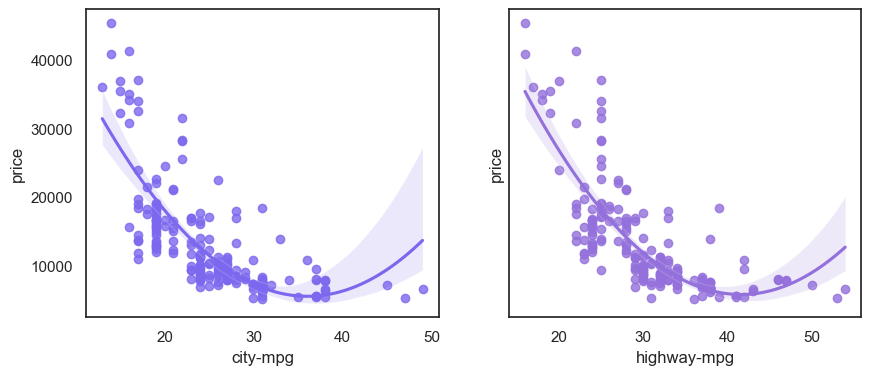

In [106]:
# 將'engine-size'及'horse-power'及'city-mpg'及'highway-mpg'欄位轉換為數字型態，並且忽視無效或缺失的值
# df['price'] = pd.to_numeric(df['price'], errors='coerce')      ('price'已於之前過程中轉換為數字型態)
df['engine-size'] = pd.to_numeric(df['engine-size'], errors='coerce')
df['horsepower'] = pd.to_numeric(df['horsepower'], errors='coerce')
df['city-mpg'] = pd.to_numeric(df['city-mpg'], errors='coerce')
df['highway-mpg'] = pd.to_numeric(df['highway-mpg'], errors='coerce')

# 將 'price'及'engine-size'及'horse-power'及'city-mpg'及'highway-mpg' 欄位中有未定義值的行列刪除
df = df.dropna(subset=['price', 'engine-size', 'horsepower', 'city-mpg','highway-mpg'])

# sharey=True共享y軸，將下列兩張圖表並排呈現
f, (ax1, ax2) = plt.subplots(1,2,sharey=True,figsize=(10,4))
# 以回歸直線，展示引擎大小與汽車價格之間的關係
sns.regplot(data=df, x="engine-size", y="price", order=2, color="palevioletred",ax=ax1)
# 以回歸直線，展示馬力與汽車價格之間的關係
sns.regplot(data=df, x="horsepower", y="price", order=2, color="cornflowerblue",ax=ax2)
plt.show()

# sharey=True共享y軸，將下列兩張圖表並排呈現
f, (ax1, ax2) = plt.subplots(1,2,sharey=True,figsize=(10,4))
# 以回歸直線，展示城市及高速公路油耗與汽車價格之間的關係
sns.regplot(data=df, x="city-mpg", y="price", order=2, color="mediumslateblue",ax=ax1)
sns.regplot(data=df, x="highway-mpg", y="price", order=2, color="mediumpurple",ax=ax2)
plt.show()

C:\Users\xdxd2\AppData\Local\Temp\ipykernel_32044\2940977713.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['engine-size-bin'] = pd.cut(df['engine-size'], bins, labels=['size_Low', 'size_Medium', 'size_High'], include_lowest=True)
C:\Users\xdxd2\AppData\Local\Temp\ipykernel_32044\2940977713.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['horsepower-bin'] = pd.cut(df['horsepower'], bins, labels=['hp_Low', 'hp_Medium', 'hp_High'], include_lowest=True)


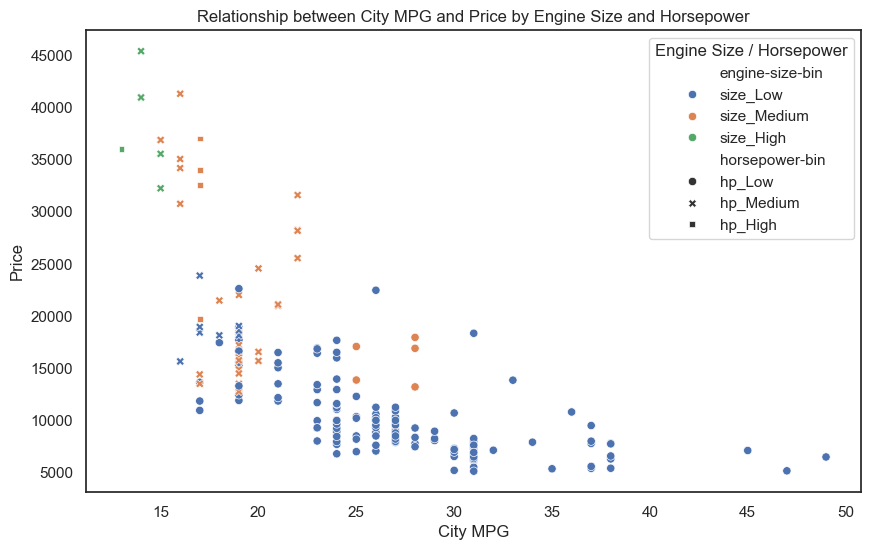

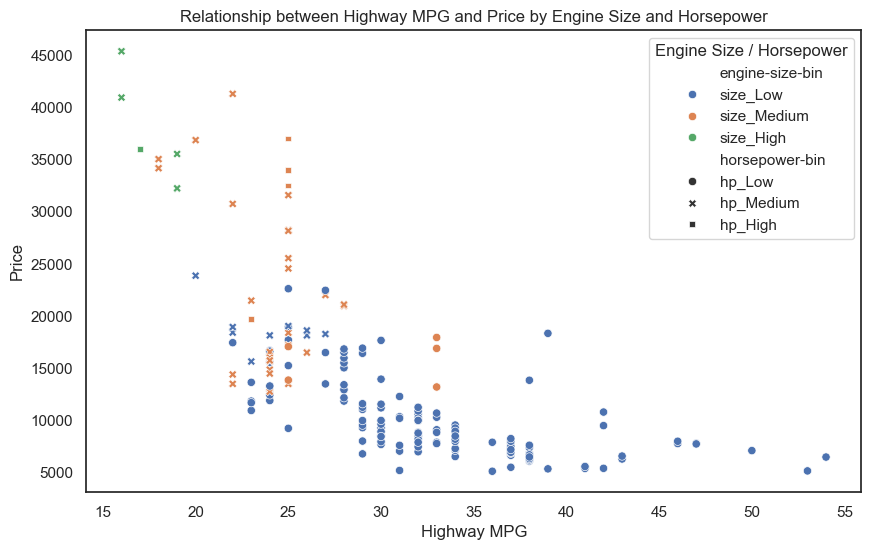

In [107]:
# 將 'engine-size' 和 'horsepower' 進行分組 (binning)

bins = np.linspace(min(df['engine-size']), max(df['engine-size']), 4)  # 創建 3 個分組
df['engine-size-bin'] = pd.cut(df['engine-size'], bins, labels=['size_Low', 'size_Medium', 'size_High'], include_lowest=True)

bins = np.linspace(min(df['horsepower']), max(df['horsepower']), 4)
df['horsepower-bin'] = pd.cut(df['horsepower'], bins, labels=['hp_Low', 'hp_Medium', 'hp_High'], include_lowest=True)

# 'city-mpg' 與價格的關係，使用 'engine-size-bin' 和 'horsepower-bin' 作為顏色區分
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='city-mpg', y='price', hue='engine-size-bin', style='horsepower-bin', palette='deep')
plt.title('Relationship between City MPG and Price by Engine Size and Horsepower')
plt.xlabel('City MPG')
plt.ylabel('Price')
plt.legend(title='Engine Size / Horsepower')
plt.show()

# 'highway-mpg' 與價格的關係，同樣使用 'engine-size-bin' 和 'horsepower-bin' 作為顏色區分
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='highway-mpg', y='price', hue='engine-size-bin', style='horsepower-bin', palette='deep')
plt.title('Relationship between Highway MPG and Price by Engine Size and Horsepower')
plt.xlabel('Highway MPG')
plt.ylabel('Price')
plt.legend(title='Engine Size / Horsepower')
plt.show()

# 在不同安全指數下，各類車子品牌的價格熱力圖



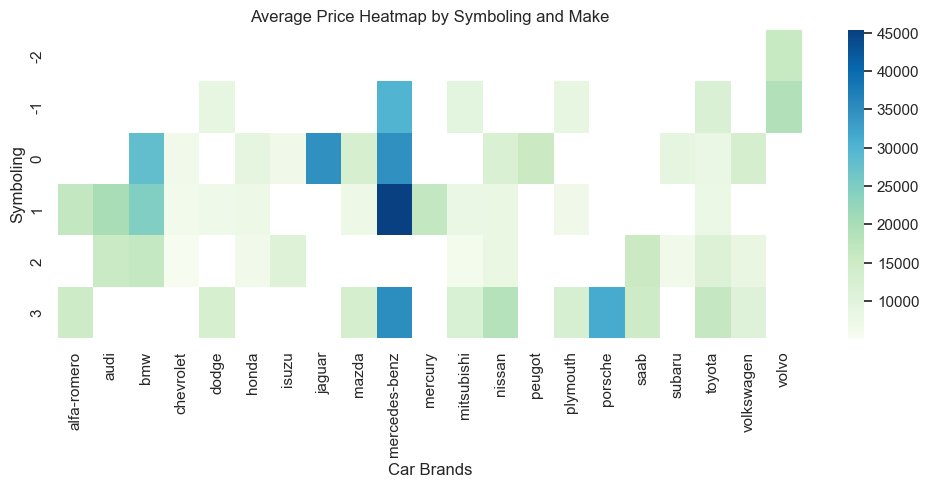

In [108]:
# 將 'price' 轉換為數字類型，並且忽略無效或缺失的值 ('price'已於之前過程中轉換為數字型態！！)
# df['price'] = pd.to_numeric(df['price'], errors='coerce')

# 使用 pivot_table 來處理重複的數據，計算每個 'symboling' 和 'make' 組合的平均 'price'
heat_df = df.pivot_table(index='symboling', columns='make', values='price', aggfunc='mean')

# 使用 seaborn 繪製熱力圖
plt.figure(figsize=(12, 4))
sns.heatmap(heat_df, annot=False, cmap="GnBu")
plt.title("Average Price Heatmap by Symboling and Make")
plt.xlabel('Car Brands')
plt.ylabel('Symboling')
plt.xticks(rotation=90)
plt.show()



# 馬力及城市/高速公路油耗量之散布圖






*   **初圖**



In [109]:
df.head()

,symboling,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,...,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,engine-size-bin,horsepower-bin
0,3,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,...,3.47,2.68,9.0,111.0,5000,21,27,13495.0,size_Low,hp_Low
1,3,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,...,3.47,2.68,9.0,111.0,5000,21,27,16500.0,size_Low,hp_Low
2,1,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,...,2.68,3.47,9.0,154.0,5000,19,26,16500.0,size_Medium,hp_Medium
3,2,audi,gas,std,four,sedan,fwd,front,99.8,176.6,...,3.19,3.4,10.0,102.0,5500,24,30,13950.0,size_Low,hp_Low
4,2,audi,gas,std,four,sedan,4wd,front,99.4,176.6,...,3.19,3.4,8.0,115.0,5500,18,22,17450.0,size_Low,hp_Low


C:\Users\xdxd2\AppData\Local\Temp\ipykernel_32044\194817164.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticks(), rotation=90)
C:\Users\xdxd2\AppData\Local\Temp\ipykernel_32044\194817164.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticks(), rotation=90)


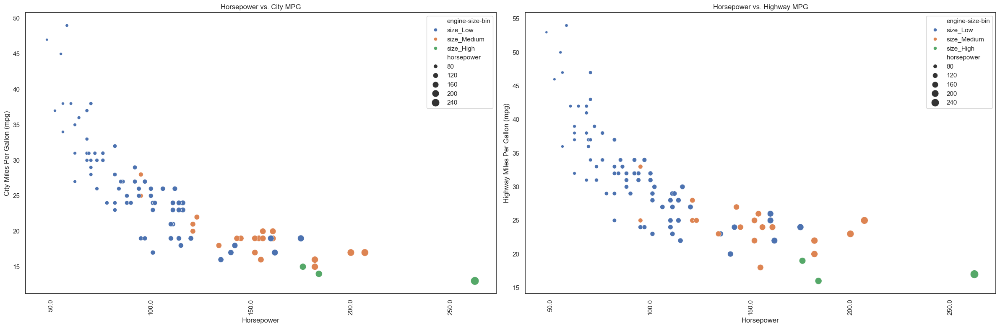

In [110]:
# 設定一個包含兩個子圖的圖形，每個子圖的尺寸為 12x4
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

# 在第一個子圖上繪製馬力對城市油耗（City MPG）的影響

sns.scatterplot(ax=ax1, data=df, x='horsepower', y='city-mpg', size='horsepower', sizes=(20, 200), hue='engine-size-bin', palette='deep')
ax1.set_title('Horsepower vs. City MPG')
ax1.set_xlabel('Horsepower')
ax1.set_ylabel('City Miles Per Gallon (mpg)')
ax1.set_xticklabels(ax1.get_xticks(), rotation=90)

# 在第二個子圖上繪製馬力對高速公路油耗（Highway MPG）的影響
sns.scatterplot(ax=ax2, data=df, x='horsepower', y='highway-mpg', size='horsepower', sizes=(20, 200), hue='engine-size-bin', palette='deep')
ax2.set_title('Horsepower vs. Highway MPG')
ax2.set_xlabel('Horsepower')
ax2.set_ylabel('Highway Miles Per Gallon (mpg)')
ax2.set_xticklabels(ax2.get_xticks(), rotation=90)

# 顯示整個圖形
plt.tight_layout()
plt.show()


- 相關性：通常，較大的引擎會消耗更多的燃料，因為它們產生更多的功率和扭矩，需要更多的燃油來維持運作。因此，引擎大小和mpg之間通常存在負相關，即引擎大小增加時，mpg降低。
- 燃料效率的影響：對於尋求燃料經濟性的消費者而言，選擇一款具有較小引擎的車型通常意味著更高的燃油效率和更低的運行成本。然而，對於需要更多動力的應用（如重載或拖曳），較大的引擎可能是必要的。



*   **修改圖，可調整圖片資料範圍**

https://zhuanlan.zhihu.com/p/370839110

In [144]:
import altair as alt

# 將 'price'及'horse-power'及'city-mpg'及'highway-mpg','make' 欄位中有未定義值的行列刪除
df = df.dropna(subset=['price', 'horsepower', 'city-mpg', 'highway-mpg', 'make'])

# 利用Altair繪製不同品牌車子的馬力及成是城市油耗量關係圖
# 設定使用者可以調整xy軸自己選取連續資料區段
brush1 = alt.selection(type='interval', resolve='union')
brush2 = alt.selection(type='interval', resolve='union')


# 將資料展現型態調整為實心圓圈，透明度為0.5，根據車輛價錢去調整原點大小
points=alt.Chart(df).mark_point(filled=True,opacity=0.5).encode(
    x='horsepower',
    y='city-mpg',
    size=alt.Size('price', scale=alt.Scale(range=[50, 450])),
    color=alt.Color('make', scale=alt.Scale(scheme='spectral')),
).add_selection(
    brush1
).properties(
    width=700,
    height=600
)
# 利用Altair繪製在不同品牌車子的馬力及成是城市油耗量關係圖中，使用者選取資料的品牌占比
bars = alt.Chart(df).mark_bar().encode(
    y='make',
    color='make',
    x='count(make)'
).transform_filter(
    brush1
)
chart1 = (points & bars)

# 利用Altair繪製不同品牌車子的馬力及成是高速公路油耗量關係圖
# 將資料展現樣式調整為實心圓圈，透明度為0.5，根據車輛價錢去調整原點大小
points2=alt.Chart(df).mark_point(filled=True,opacity=0.5).encode(
    x='horsepower',
    y='highway-mpg',
    size=alt.Size('price', scale=alt.Scale(range=[50, 450])),
    color=alt.Color('make', scale=alt.Scale(scheme='spectral')),
).add_selection(
    brush2
).properties(
    width=700,
    height=600
)

# 利用Altair繪製在不同品牌車子的馬力及成是高速公路油耗量關係圖中，使用者選取資料的品牌占比
bars2 = alt.Chart(df).mark_bar().encode(
    y='make',
    color='make',
    x='count(make)'
).transform_filter(
    brush2
)
chart2 = (points2 & bars2)
chart1 | chart2



C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\U

alt.HConcatChart(...)

In [142]:
import altair as alt

# 將 'price'及'horse-power'及'city-mpg'及'highway-mpg','make' 欄位中有未定義值的行列刪除
df = df.dropna(subset=['price', 'horsepower', 'city-mpg', 'highway-mpg', 'make'])

# 利用Altair繪製不同品牌車子的馬力及成是城市油耗量關係圖
# 設定使用者可以調整xy軸自己選取連續資料區段
brush1 = alt.selection(type='interval', resolve='union')
brush2 = alt.selection(type='interval', resolve='union')


# 國家與品牌對應關係
country_brand_mapping = {
    'toyota': 'Japan', 'nissan': 'Japan', 'honda': 'Japan', 'subaru': 'Japan', 'isuzu': 'Japan', 'mitsubishi': 'Japan', 'mazda': 'Japan',
    'volkswagen': 'Germany', 'mercedes-benz': 'Germany', 'bmw': 'Germany', 'audi': 'Germany', 'porsche': 'Germany',
    'peugot': 'France', 'renault': 'France',
    'volvo': 'Sweden', 'saab': 'Sweden',
    'dodge': 'USA', 'plymouth': 'USA', 'chevrolet': 'USA', 'mercury': 'USA',
    'jaguar': 'UK', 'alfa-romero': 'Italy'
}

# 添加國家分組到 DataFrame
df['country'] = df['make'].map(country_brand_mapping)


# 將資料展現型態調整為實心圓圈，透明度為0.5，根據車輛價錢去調整原點大小
points=alt.Chart(df).mark_point(filled=True,opacity=0.5).encode(
    x='horsepower',
    y='city-mpg',
    size=alt.Size('price', scale=alt.Scale(range=[50, 450])),
    color=alt.Color('country', scale=alt.Scale(scheme='category10')),
).add_selection(
    brush1
).properties(
    width=700,
    height=600
)
# 利用Altair繪製在不同品牌車子的馬力及成是城市油耗量關係圖中，使用者選取資料的品牌占比
bars = alt.Chart(df).mark_bar().encode(
    y='make',
    color='country',
    x='count(make)'
).transform_filter(
    brush1
)
chart1 = (points & bars)

# 利用Altair繪製不同品牌車子的馬力及成是高速公路油耗量關係圖
# 將資料展現樣式調整為實心圓圈，透明度為0.5，根據車輛價錢去調整原點大小
points2=alt.Chart(df).mark_point(filled=True,opacity=0.5).encode(
    x='horsepower',
    y='highway-mpg',
    size=alt.Size('price', scale=alt.Scale(range=[50, 450])),
    color=alt.Color('country', scale=alt.Scale(scheme='category10')),
).add_selection(
    brush2
).properties(
    width=700,
    height=600
)

# 利用Altair繪製在不同品牌車子的馬力及成是高速公路油耗量關係圖中，使用者選取資料的品牌占比
bars2 = alt.Chart(df).mark_bar().encode(
    y='make',
    color='country',
    x='count(make)'
).transform_filter(
    brush2
)
chart2 = (points2 & bars2)
chart1 | chart2



C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\U

alt.HConcatChart(...)

# 匯入Audi&Ford資料


*   audi
*   ford



In [114]:
import pandas as pd
# 讀取資料
audi_data = pd.read_csv('../car_data/audi.csv')
ford_data = pd.read_csv('../car_data/ford.csv')

# 刪除ford資料中不合理的數據(年分)
# 第17726筆資料年份為'2060年'
ford_data = ford_data.drop(17726)

# 刪除audi資料中偏差過大的值
# 第9822筆資料里程數為'320000'
audi_data = audi_data.drop(9822)

#列出各label
audi_data.info()
ford_data.info()




<class 'pandas.core.frame.DataFrame'>
Index: 10667 entries, 0 to 10667
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         10667 non-null  object 
 1   year          10667 non-null  int64  
 2   price         10667 non-null  int64  
 3   transmission  10667 non-null  object 
 4   mileage       10667 non-null  int64  
 5   fuelType      10667 non-null  object 
 6   tax           10667 non-null  int64  
 7   mpg           10667 non-null  float64
 8   engineSize    10667 non-null  float64
dtypes: float64(2), int64(4), object(3)
memory usage: 833.4+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 17964 entries, 0 to 17964
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         17964 non-null  object 
 1   year          17964 non-null  int64  
 2   price         17964 non-null  int64  
 3   transmission  17964 non-null  object 

| Column Name   | Description    | Data Type |
|---------------|----------------|-----------|
| model         | 模型           | object    |
| year          | 年份           | int64     |
| price         | 價格           | int64     |
| transmission  | 傳動方式       | object    |
| mileage       | 里程數         | int64     |
| fuelType      | 燃料類型       | object    |
| tax           | 稅金           | int64     |
| mpg           | 每加侖英里數   | float64   |
| engineSize    | 引擎大小       | float64   |




*   **audi詳細資料**



In [115]:
audi_data

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,A1,2017,12500,Manual,15735,Petrol,150,55.4,1.4
1,A6,2016,16500,Automatic,36203,Diesel,20,64.2,2.0
2,A1,2016,11000,Manual,29946,Petrol,30,55.4,1.4
3,A4,2017,16800,Automatic,25952,Diesel,145,67.3,2.0
4,A3,2019,17300,Manual,1998,Petrol,145,49.6,1.0
...,...,...,...,...,...,...,...,...,...
10663,A3,2020,16999,Manual,4018,Petrol,145,49.6,1.0
10664,A3,2020,16999,Manual,1978,Petrol,150,49.6,1.0
10665,A3,2020,17199,Manual,609,Petrol,150,49.6,1.0
10666,Q3,2017,19499,Automatic,8646,Petrol,150,47.9,1.4




*   **ford詳細資料**




In [116]:
ford_data

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,Fiesta,2017,12000,Automatic,15944,Petrol,150,57.7,1.0
1,Focus,2018,14000,Manual,9083,Petrol,150,57.7,1.0
2,Focus,2017,13000,Manual,12456,Petrol,150,57.7,1.0
3,Fiesta,2019,17500,Manual,10460,Petrol,145,40.3,1.5
4,Fiesta,2019,16500,Automatic,1482,Petrol,145,48.7,1.0
...,...,...,...,...,...,...,...,...,...
17960,Fiesta,2016,7999,Manual,31348,Petrol,125,54.3,1.2
17961,B-MAX,2017,8999,Manual,16700,Petrol,150,47.1,1.4
17962,B-MAX,2014,7499,Manual,40700,Petrol,30,57.7,1.0
17963,Focus,2015,9999,Manual,7010,Diesel,20,67.3,1.6


# 不同車型 v.s.平均價格

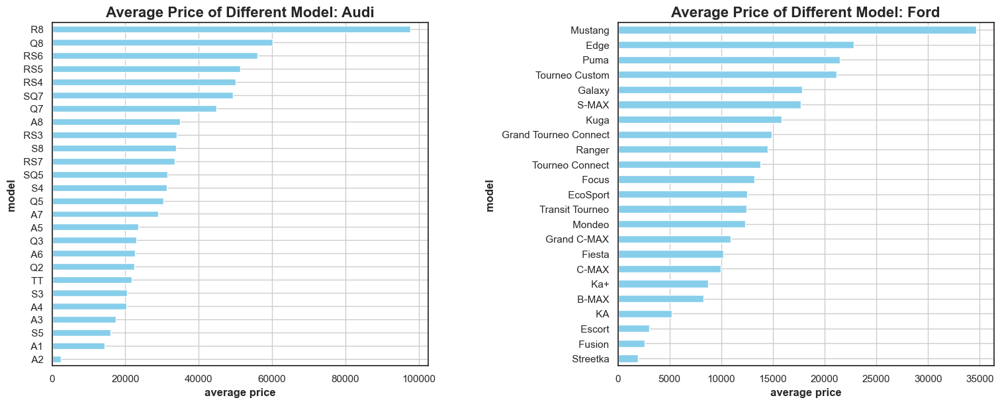

In [117]:
import matplotlib.pyplot as plt
# 設定圖表大小
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True, gridspec_kw={'wspace': 0.1})
sns.set_theme(style='whitegrid')

# 先找出不同車型對應的平均價格並排序
audi_avg_price = audi_data.groupby(['model'])['price'].mean().sort_values()
ford_avg_price = ford_data.groupby(['model'])['price'].mean().sort_values()

# 設定圖表種類、顏色
audi_avg_price.plot(kind='barh', color='skyblue', ax=ax1)
# 設定圖表標題、兩軸標題
ax1.set_title('Average Price of Different Model: Audi', fontsize=16, fontweight='bold')
ax1.set_xlabel('average price', fontweight='bold')
ax1.set_ylabel('model', fontweight='bold')

# 設定圖表種類、顏色
ford_avg_price.plot(kind='barh', color='skyblue', ax=ax2)
# 設定圖表標題、兩軸標題
ax2.set_title('Average Price of Different Model: Ford', fontsize=16, fontweight='bold')
ax2.set_xlabel('average price', fontweight='bold')
ax2.set_ylabel('model', fontweight='bold')

# 顯示圖表
plt.show()

# 不同車型的年度價格折線圖

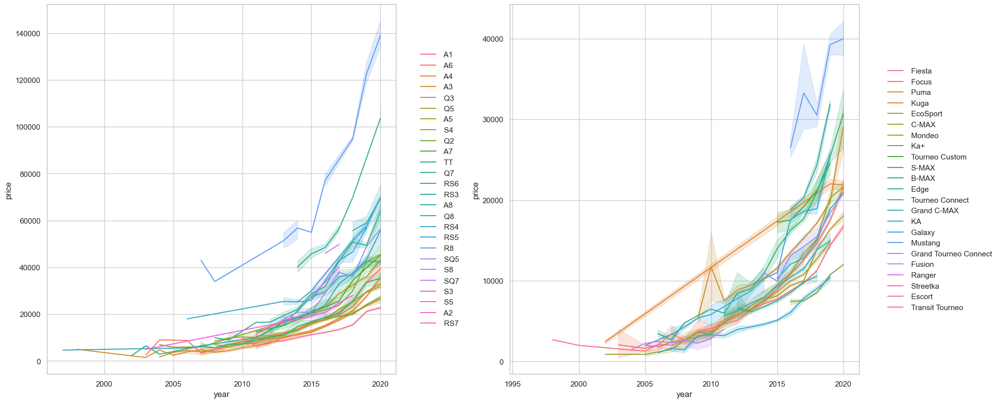

In [118]:
import seaborn as sns
import matplotlib.pyplot as plt
# avg_price = audi_data.groupby(['model', 'year'])['price'].sum()
# 設定圖表主題
sns.set_theme(style="whitegrid")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), constrained_layout=True)
# sns.histplot(config_counts)


# audi
# 先將data中的年份和價格的資料換成數字
audi_data['price'] = pd.to_numeric(audi_data['price'], errors='coerce')
audi_data['year'] = pd.to_numeric(audi_data['year'], errors='coerce')

# 畫出折線圖
sns.lineplot(audi_data, x='year', y='price', hue='model', ax=ax1)
sns.move_legend(ax1, "center right", bbox_to_anchor=(1.2, 0.5), ncol=1, title=None, frameon=False)

# ford
# 先將data中的年份和價格的資料換成數字
ford_data['price'] = pd.to_numeric(ford_data['price'], errors='coerce')
ford_data['year'] = pd.to_numeric(ford_data['year'], errors='coerce')

# 畫出折線圖
sns.lineplot(ford_data, x='year', y='price', hue='model',ax=ax2)
sns.move_legend(ax2, "center right", bbox_to_anchor=(1.4, 0.5), ncol=1, title=None, frameon=False)

plt.show()

# 引擎大小v.s.mpg

**引擎大小與mpg的關係：散點圖或線性圖來探索引擎大小與每加侖英里數（mpg）之間的關係**

In [153]:
import seaborn as sns
import altair as alt

# 設定兩張圖表的選擇器（範圍選取），resolve='union'設為區域選擇器
brush1 = alt.selection_interval(resolve='union')
brush2 = alt.selection_interval(resolve='union')


# Audi model(因為數量限制，隨機選取5000筆資料)
audi_chart = alt.Chart(audi_data.sample(5000)).mark_point(size=25).encode(
    x='engineSize',
    y='mpg',
    color=alt.condition(brush1, 'year:O', alt.value('lightgray'), scale=alt.Scale(scheme='rainbow')),  # 'year:O'將'year'設為'Ordinal'類型資料
    tooltip=[  alt.Tooltip('year:N'),    # 設定當游標停在資料點上時會顯示的資料
               alt.Tooltip('mpg:Q'),
               alt.Tooltip('mileage:Q'),
              ]
).properties(
    width=700,
    height=600,
    title='Audi Model'
).add_selection(brush1)

# 計算石油引擎和柴油引擎的資料數之長條圖
audi_bars = alt.Chart(audi_data.sample(5000)).mark_bar().encode(
    x='count():N',
    y='fuelType:N',
    tooltip=[alt.Tooltip('count()')]   # 設定當游標停在資料點上時會顯示的資料
).properties(
    width=500
).transform_filter(brush1)  # 將選取範圍套用到資料過濾


# Ford model(因為數量限制，隨機選取5000筆資料)
ford_chart = alt.Chart(audi_data.sample(5000)).mark_point(size=25).encode(
    x='engineSize',
    y='mpg',
    color=alt.condition(brush2, 'year:O', alt.value('lightgray'), scale=alt.Scale(scheme='rainbow')),  # 'year:O'將'year'設為'Ordinal'類型資料
    tooltip=[  alt.Tooltip('year:N'),    # 設定當游標停在資料點上時會顯示的資料
               alt.Tooltip('mpg:Q'),
               alt.Tooltip('mileage:Q'),
              ]
).properties(
    width=700,
    height=600,
    title='Ford Model'
).add_selection(brush2)

# 計算石油引擎和柴油引擎的資料數之長條圖
ford_bars = alt.Chart(ford_data.sample(5000)).mark_bar().encode(
    x='count()',
    y='fuelType:N',
    tooltip=[alt.Tooltip('count()')]  # 設定當游標停在資料點上時會顯示的資料
).properties(
    width=500
).transform_filter(brush2)  # 將選取範圍套用到資料過濾

# 結合散點圖和長條圖
audi_chart = audi_chart&audi_bars
ford_chart = ford_chart&ford_bars

# 垂直堆疊兩張圖表，resolve_scale將顏色的比例（scale）視為獨立的，不受其他圖表的影響
alt.hconcat(audi_chart, ford_chart).resolve_scale(color='independent')

C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\U

alt.HConcatChart(...)

- 引擎大小：引擎大小，通常以升（L）為單位，指的是引擎汽缸內燃料和空氣混合燃燒的空間容積。引擎大小越大，理論上可以產生更大的功率和扭矩。
- 每加侖英里數（mpg）：這是衡量汽車燃油效率的指標，即汽車能夠用一加侖燃油行駛多少英里。高mpg值表示燃油效率較高，消耗較少的燃料行駛更長的距離。


技術進步的作用：現代引擎技術，如渦輪增壓、直噴技術、和變速技術，可以在不犧牲功率的情況下提高小型引擎的效率，從而改善其mpg。這使得即使是較小的引擎也能提供較大引擎的性能。

# 里程數和價格的線性回歸圖(評估汽車折舊情況)

**比較各車型**





*   **audi**



<Figure size 3000x1200 with 0 Axes>

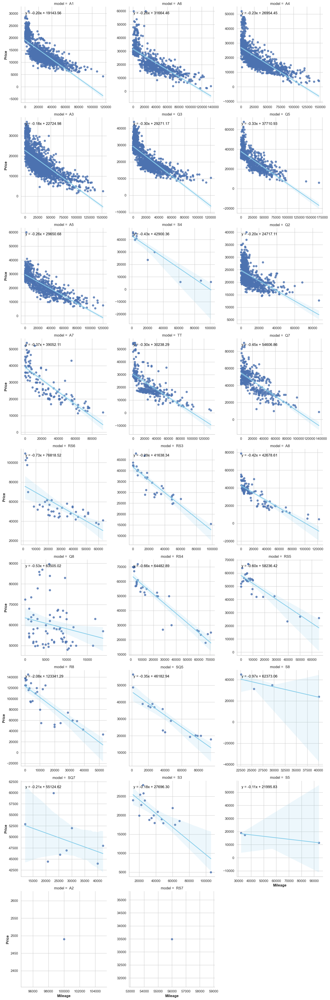

In [157]:
import seaborn as sns
import matplotlib.pyplot as plt

# 设定图表格式
sns.set_theme(style="whitegrid", color_codes=True)
plt.figure(figsize=(30, 12))

# 依照各车型分成不同表格，每行3个子图，各自拥有独立的坐标轴
g = sns.lmplot(data=audi_data, x='mileage', y='price', col='model', col_wrap=3,
               line_kws={'color': 'skyblue'}, facet_kws={'sharex': False, 'sharey': False, 'margin_titles': True})

# 设置x轴和y轴标签
g.set_axis_labels('Mileage', 'Price')

# 添加每个子图的回归系数
for ax in g.axes.flat:
    # 检查是否有线性回归线存在
    lines = ax.get_lines()
    if len(lines) > 0:
        regline = lines[0]
        x = regline.get_xdata()
        y = regline.get_ydata()
        
        # 确保x和y数据足够计算斜率和截距
        if len(x) > 1 and len(y) > 1:
            # 计算回归系数
            slope = (y[-1] - y[0]) / (x[-1] - x[0])
            intercept = y[0] - slope * x[0]
            
            # 在图上显示回归系数
            ax.text(0.05, 0.95, f'y = {slope:.2f}x + {intercept:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=12, color='black')

# 显示图表
plt.show()




*   **ford**



<Figure size 3000x1200 with 0 Axes>

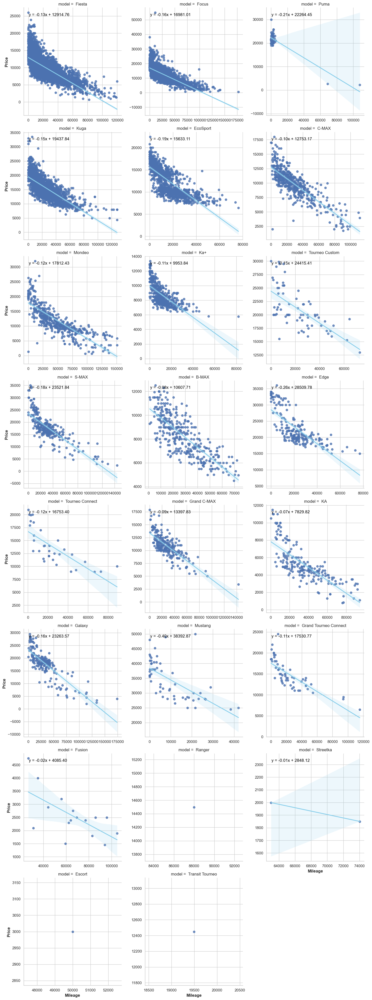

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt

# 设定图表格式
sns.set_theme(style="whitegrid", color_codes=True)
plt.figure(figsize=(30, 12))

# 依照各车型分成不同表格，每行3个子图，各自拥有独立的坐标轴
g = sns.lmplot(data=ford_data, x='mileage', y='price', col='model', col_wrap=3,
               line_kws={'color': 'skyblue'}, facet_kws={'sharex': False, 'sharey': False, 'margin_titles': True})

# 设置x轴和y轴标签
g.set_axis_labels('Mileage', 'Price')

# 添加每个子图的回归系数
for ax in g.axes.flat:
    # 检查是否有线性回归线存在
    lines = ax.get_lines()
    if len(lines) > 0:
        regline = lines[0]
        x = regline.get_xdata()
        y = regline.get_ydata()
        
        # 确保x和y数据足够计算斜率和截距
        if len(x) > 1 and len(y) > 1:
            # 计算回归系数
            slope = (y[-1] - y[0]) / (x[-1] - x[0])
            intercept = y[0] - slope * x[0]
            
            # 在图上显示回归系数
            ax.text(0.05, 0.95, f'y = {slope:.2f}x + {intercept:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=12, color='black')

# 显示图表
plt.show()


# 各個數值型特徵之間的相關性
**不包含'model' 和 'transmission'和 'fuelType'**

In [122]:
audi_data

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,A1,2017,12500,Manual,15735,Petrol,150,55.4,1.4
1,A6,2016,16500,Automatic,36203,Diesel,20,64.2,2.0
2,A1,2016,11000,Manual,29946,Petrol,30,55.4,1.4
3,A4,2017,16800,Automatic,25952,Diesel,145,67.3,2.0
4,A3,2019,17300,Manual,1998,Petrol,145,49.6,1.0
...,...,...,...,...,...,...,...,...,...
10663,A3,2020,16999,Manual,4018,Petrol,145,49.6,1.0
10664,A3,2020,16999,Manual,1978,Petrol,150,49.6,1.0
10665,A3,2020,17199,Manual,609,Petrol,150,49.6,1.0
10666,Q3,2017,19499,Automatic,8646,Petrol,150,47.9,1.4


In [123]:
ford_data

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,Fiesta,2017,12000,Automatic,15944,Petrol,150,57.7,1.0
1,Focus,2018,14000,Manual,9083,Petrol,150,57.7,1.0
2,Focus,2017,13000,Manual,12456,Petrol,150,57.7,1.0
3,Fiesta,2019,17500,Manual,10460,Petrol,145,40.3,1.5
4,Fiesta,2019,16500,Automatic,1482,Petrol,145,48.7,1.0
...,...,...,...,...,...,...,...,...,...
17960,Fiesta,2016,7999,Manual,31348,Petrol,125,54.3,1.2
17961,B-MAX,2017,8999,Manual,16700,Petrol,150,47.1,1.4
17962,B-MAX,2014,7499,Manual,40700,Petrol,30,57.7,1.0
17963,Focus,2015,9999,Manual,7010,Diesel,20,67.3,1.6


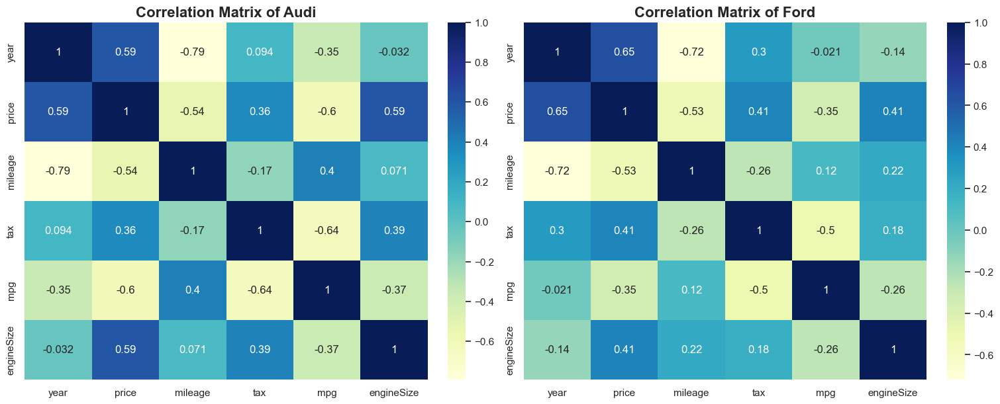

In [124]:
# 利用熱力圖顯示各個特徵之間的相關係數矩陣
audi_data_v2 = audi_data.drop(['model', 'transmission', 'fuelType'], axis=1)
# audi_data = audi_data.groupby('year').mean()
# audi_data.reset_index(inplace=True)

# 利用熱力圖顯示各個特徵之間的相關係數矩陣
ford_data_v2 = ford_data.drop(['model', 'transmission', 'fuelType'], axis=1)
# ford_data = ford_data.groupby('year').mean()
# ford_data.reset_index(inplace=True)

# 計算相關係數
correlation_matrix_audi = audi_data_v2.corr()
correlation_matrix_ford = ford_data_v2.corr()

# 設定圖表大小
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)

# annot=True 在圖表中顯示相關係數，畫出相關係數的熱力圖
sns.heatmap(correlation_matrix_audi, annot=True, cmap='YlGnBu', ax=ax1)
ax1.set_title('Correlation Matrix of Audi', fontsize=16, fontweight='bold')
sns.heatmap(correlation_matrix_ford, annot=True, cmap='YlGnBu', ax=ax2)
ax2.set_title('Correlation Matrix of Ford', fontsize=16, fontweight='bold')

# 顯示圖表
plt.show()


# 不同車型、年份之mpg和mileage的之間的關係


In [163]:
import altair as alt
# 選擇年份在 2002 到 2020 之間的數據
selected_audi = audi_data[(audi_data['year'] >= 2002) & (audi_data['year'] <= 2020)]
selected_ford = ford_data[(ford_data['year'] >= 2002) & (ford_data['year'] <= 2020)]


# 從選擇的數據中隨機選取 5000 筆樣本
trim_audi = selected_audi.sample(n=5000, random_state=42)
trim_ford = selected_ford.sample(n=5000, random_state=42)

# 創建單一選擇（single selection）的選擇器，初始值設定為年份=2010，範圍2002~2020
select_year = alt.selection_single(
    name='select', 
    init={'year': 2010},
    bind=alt.binding_range(min=2002, max=2020, step=1)
)


In [164]:

# audi
audi_chart = alt.Chart(trim_audi).mark_point(size=50).encode(
    x='mileage',
    y='mpg',
    color=alt.Color('model', scale=alt.Scale(scheme='spectral')),
    tooltip=[  alt.Tooltip('model:N'),    # 設定當游標停在資料點上時會顯示的資料
               alt.Tooltip('mpg:Q'),
               alt.Tooltip('mileage:Q'),
              ]
).properties(
    width=600,
    height=300,
    title='Audi Model',
).add_selection(select_year).transform_filter(select_year).interactive()  # transform_filter()可以用於根據選擇器的狀態對數據進行過濾

# ford
ford_chart = alt.Chart(trim_ford).mark_point(size=50).encode(
    x='mileage',
    y='mpg',
    color=alt.Color('model', scale=alt.Scale(scheme='spectral')),
    tooltip=[  alt.Tooltip('model:N'),    # 設定當游標停在資料點上時會顯示的資料
               alt.Tooltip('mpg:Q'),
               alt.Tooltip('mileage:Q'),
              ]
).properties(
    width=600,
    height=300,
    title='Ford Model'
).add_selection(select_year).transform_filter(select_year).interactive()  # transform_filter()可以用於根據選擇器的狀態對數據進行過濾


# 垂直堆疊兩張圖表，resolve_scale將顏色的比例（scale）視為獨立的，不受其他圖表的影響
alt.vconcat(audi_chart, ford_chart).resolve_scale(color='independent')



C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\Users\xdxd2\AppData\Roaming\Python\Python310\site-packages\altair\utils\core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
C:\U

alt.VConcatChart(...)

# 變速箱類型 v.s. 價格

In [128]:
# 變速箱類型對價格的影響：用柱狀圖來比較不同變速箱類型車輛的平均價格。
# reset_index()將series轉換成dataframe
test_audi = audi_data.groupby(['transmission', 'model'])['price'].mean().reset_index()
test_ford = ford_data.groupby(['transmission', 'model'])['price'].mean().reset_index()

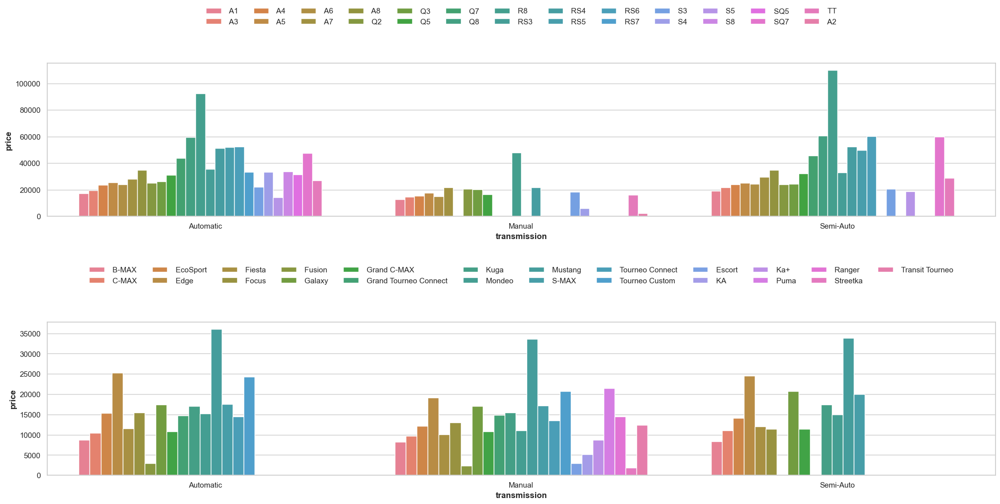

In [129]:
import matplotlib.pyplot as plt
# 設定圖表格式
sns.set_theme(style="whitegrid", rc={'axes.labelweight': 'bold'})
fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(20,10), constrained_layout=True, gridspec_kw={'hspace': 0.1})

# 畫出柱狀圖
sns.barplot(data=test_audi, x='transmission', y='price', hue='model', ax=ax1)
sns.barplot(data=test_ford, x='transmission', y='price', hue='model', ax=ax2)

# 設定圖例格式
sns.move_legend(ax1, "lower center", bbox_to_anchor=(.5, 1.2), ncol=13, title=None, frameon=False)
sns.move_legend(ax2, "lower center", bbox_to_anchor=(.5, 1.2), ncol=12, title=None, frameon=False)

# 顯示圖表
plt.show()